$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bb}[1]{\boldsymbol{#1}}
$$
# Part 6: YOLO - Objects Detection
<a id=part6></a>

In this part we will use an object detection architecture called YOLO (You only look once) to detect objects in images. We'll use an already trained model weights (v5) found here: https://github.com/ultralytics/yolov5

In [9]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

# Load the YOLO model
model = torch.hub.load("ultralytics/yolov5", "yolov5s")
model.to(device)
# Images
img1 = 'imgs/DolphinsInTheSky.jpg'  
img2 = 'imgs/cat-shiba-inu-2.jpg' 

cpu
requirements: Ultralytics requirements ['gitpython>=3.1.30', 'pillow>=10.3.0', 'urllib3>=2.5.0 ; python_version > "3.8"'] not found, attempting AutoUpdate...
WARNING requirements:  AutoUpdate skipped (offline)


Using cache found in C:\Users\Boaz Maron/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2025-12-20 Python-3.8.12 torch-1.10.1 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


## Inference with YOLO
<a id=part6_1></a>

You are provided with 2 images (img1 and img2).
**TODO**:
1. Detect objects using the YOLOv5 model for these 2 images.
2. Print the inference output with bounding boxes.
3. Look at the inference results and answer the question below.


inference output img 1:
image 1/1: 183x275 2 persons, 1 surfboard
Speed: 26.9ms pre-process, 128.6ms inference, 6.0ms NMS per image at shape (1, 3, 448, 640)
         xmin       ymin        xmax        ymax  confidence  class       name
0  100.278381  47.370995  187.863556  118.462662    0.903491      0     person
1   22.531355  20.887983  128.905212   92.257050    0.500974      0     person
2   85.617989  98.014671  139.018356  124.627922    0.367015     37  surfboard


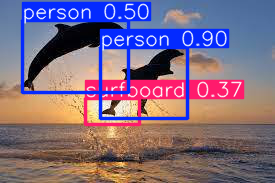

inference output img 2:
image 1/1: 750x750 2 cats, 1 dog
Speed: 24.0ms pre-process, 144.3ms inference, 0.0ms NMS per image at shape (1, 3, 640, 640)
         xmin        ymin        xmax        ymax  confidence  class name
0   11.568600  115.774918  312.757080  667.323730    0.655977     15  cat
1  363.715485  290.178589  750.000000  721.983826    0.509416     16  dog
2  311.190826  102.437492  595.031738  687.870605    0.391701     15  cat


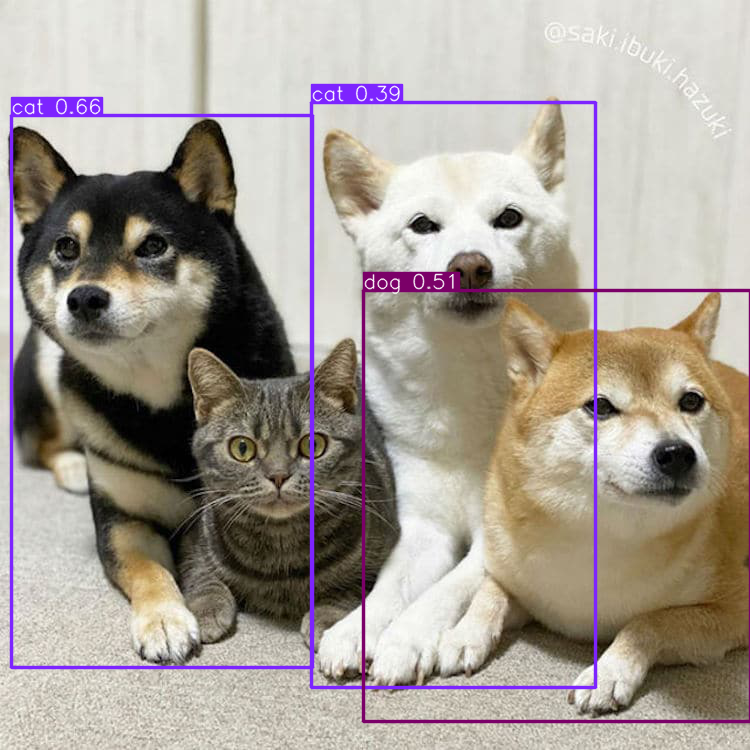

In [4]:
with torch.no_grad():
    #Detecting objects using YOLOv5
    objs_img1 = model(img1)
    objs_img2 = model(img2)

    #Printing inference output1 with bounding boxes
    print('inference output img 1:')
    print(objs_img1)
    print(objs_img1.pandas().xyxy[0])
    objs_img1.show()

    #Printing inference output2 with bounding boxes
    print('inference output img 2:')
    print(objs_img2)
    print(objs_img2.pandas().xyxy[0])
    objs_img2.show()

### Question 1

Analyze the inference results of the 2 images. 
1. How well did the model detect the objects in the pictures? with what confidance?
2. What can possibly be the reason for the model failures? suggest methods to resolve that issue.
3. recall that we learned how to fool a model by adverserial attack (PGD), describe how you would attack an Object Detection model (such as YOLO).

In [3]:
#====
from cs236781.answers import display_answer
import hw2.answers
#====

display_answer(hw2.answers.part6_q1)


**Your answer:**

1. The model detection of the objects is bad.

    In both images, the bounding boxes the model produces where not very good. 
In the first image, he interpreted only a part of the dolphin as an object - not all of the dolphin.
In the second image, he didnt produce a bounding box for the real cat.

    The model failed to classify correctly on almost all of the bounding boxes(failed on +80% of the boxes).
Moreover, he got high confidence in some of these false classification.
For example, in the first picture he classify the dolphins as humans with confidence of 0.9.
Which make it hard to rely on such a model.

2. There are several possible reasons for the model failures, one of them is:

    Domain shift. 
The model might have trained on clean images of dolphins, and not images on dolphins that are facing the sun. 
Or, it might be even that the training data did not had a dolphin class at all.
Also, it might have trained on dogs that have more "dogs characteristics" then the provided Shiba Inu dogs(which are a little similar to cats).
Therefore, because both of the photos are a little unique, it might be that the problems in classifications is duo to a domain shift.

    To resolve this, we should perform fine-tuning.
We can train the model with a richer dataset that would include pictures of doplhins facing the sun, Shiba Inu dogs, and more unique pictures.

    Another possible way to resolve this issue is data augmantation.
For example, in the dolphins picture, we might be able to increase lighting such that we could see the skin color of the dolphins.
Then, the model might identify the dolphins as dolphins and not as humans.

3. A PGD attack on an Object Detection model would itertively insert noise to input images in order to minimize performances.
This includes minimzing the right class classification confidance, and bounding box selection.
This will lead to missed detections or confidence misclassifications.



## Creative Detection Failures

<a id=part6_2></a>

Object detection pitfalls could be, for example: **occlusion** - when the objects are partially occlude, and thus missing important features, **model bias** - when a model learn some bias about an object, it could recognize it as something else in a different setup, and many others like **Deformation**, **Illumination conditions**, **Cluttered** or **textured background and blurring** due to moving objects.

**TODO**: Take pictures and that demonstrates 3 of the above object detection pitfalls, run inference and analyze the results.

image 1/1: 2304x1856 1 apple
Speed: 86.8ms pre-process, 294.7ms inference, 2.0ms NMS per image at shape (1, 3, 640, 544)
          xmin       ymin        xmax         ymax  confidence  class   name
0  1091.855835  1717.4198  1357.05481  2013.912476    0.473365     47  apple


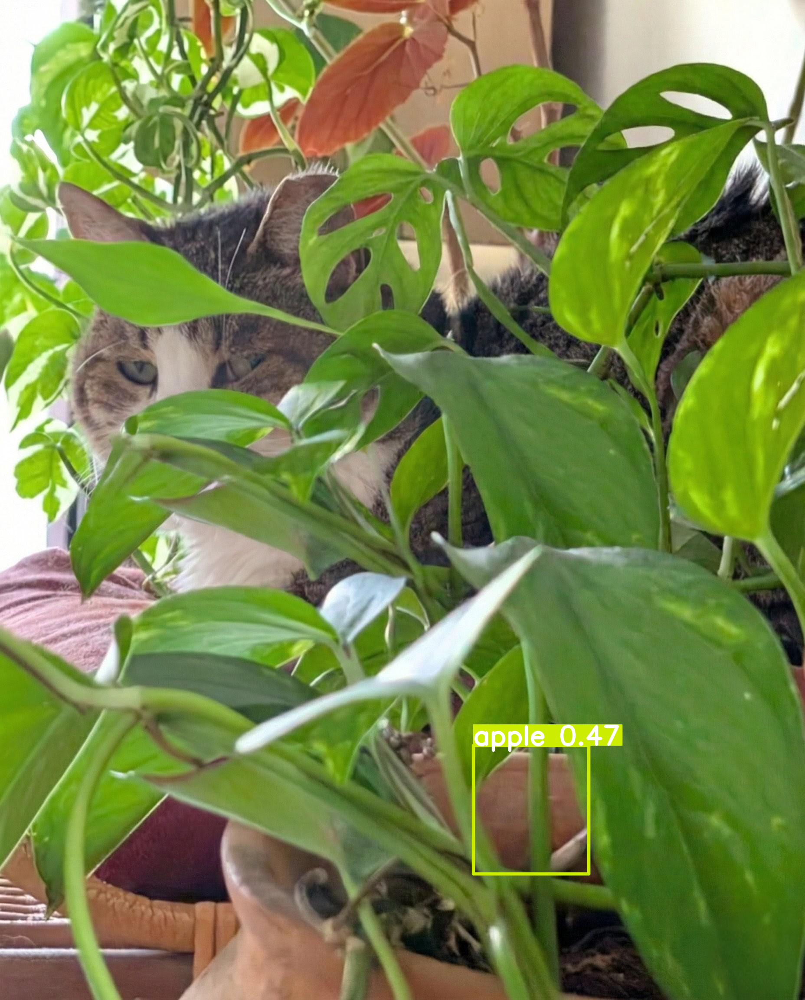

image 1/1: 1480x1369 1 bear, 1 sports ball
Speed: 100.8ms pre-process, 361.0ms inference, 2.0ms NMS per image at shape (1, 3, 640, 608)
         xmin       ymin         xmax         ymax  confidence  class  \
0  993.372009  27.739573  1206.332153   175.821182    0.428993     32   
1   65.861786  22.638266  1321.950195  1421.806152    0.288499     21   

          name  
0  sports ball  
1         bear  


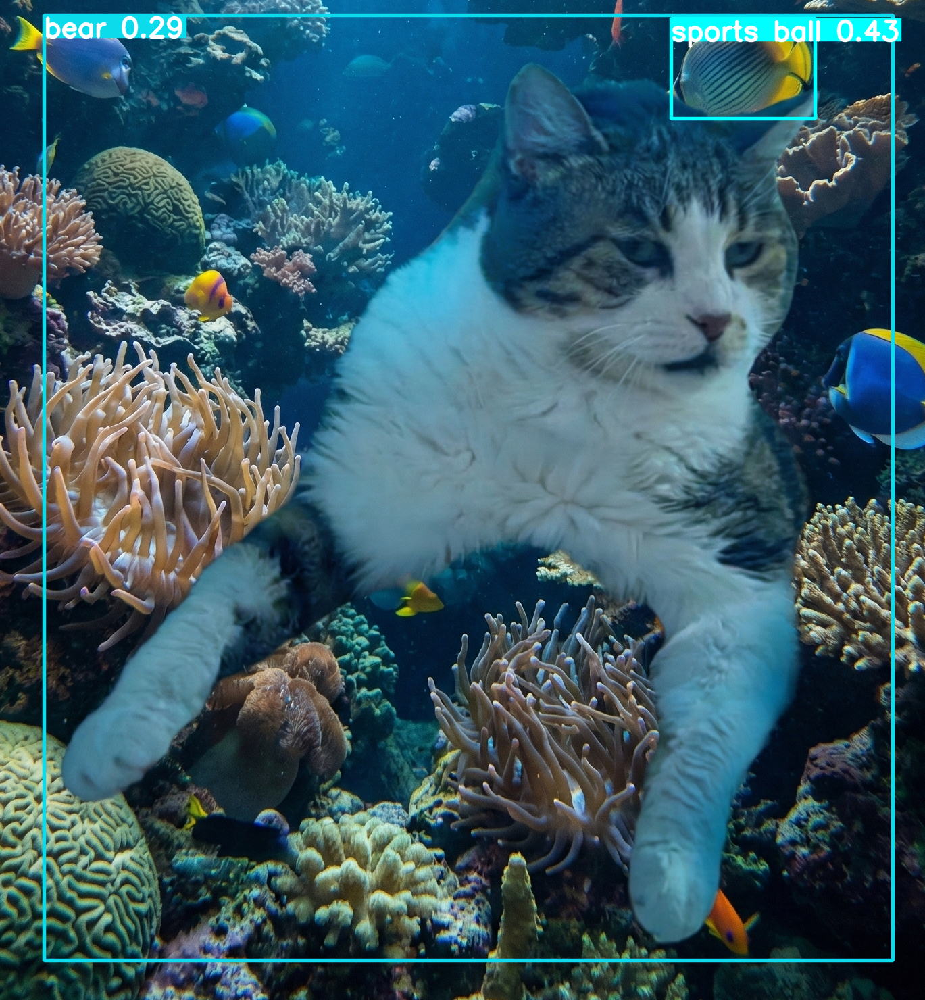

image 1/1: 1350x1080 (no detections)
Speed: 60.2ms pre-process, 403.1ms inference, 1.5ms NMS per image at shape (1, 3, 640, 512)
Empty DataFrame
Columns: [xmin, ymin, xmax, ymax, confidence, class, name]
Index: []


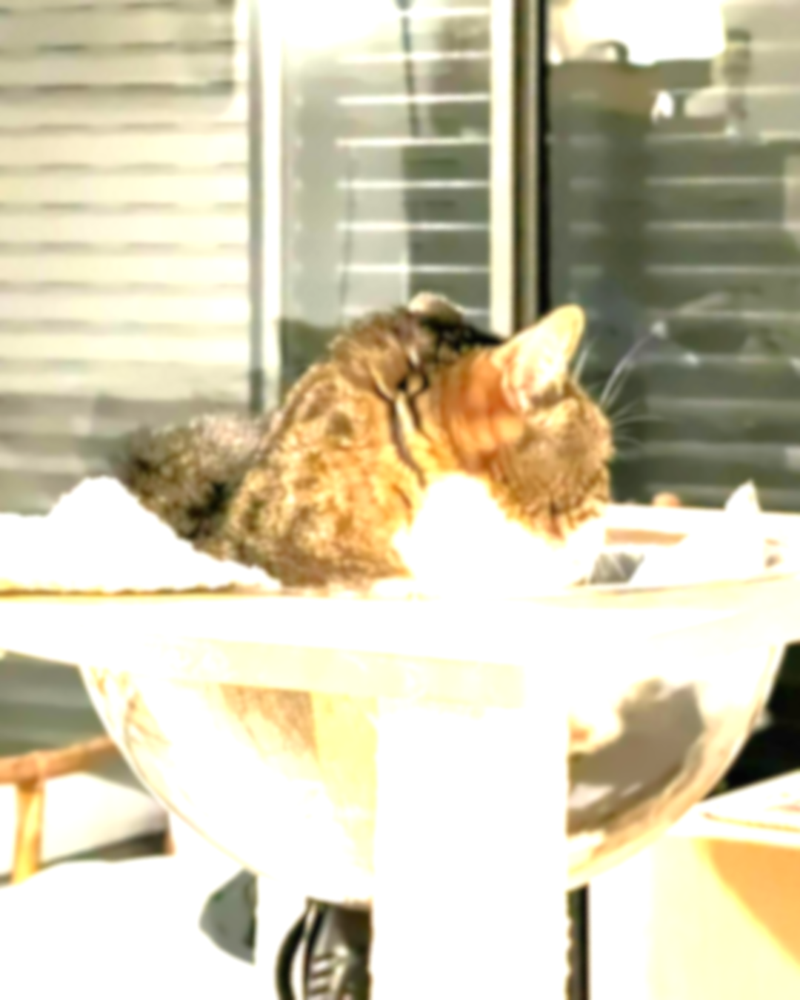

In [65]:
# You can change the images names in the code below, and add new ones

images = [
    "imgs/picture_01.jpg",
    "imgs/picture_02.png",
    "imgs/picture_03.png"
]

with torch.no_grad():
    for img in images:
        objs_img = model(img)
        print(objs_img)
        print(objs_img.pandas().xyxy[0])
        objs_img.show()

### Question 3

Analyize the results of the inference. 
1. How well did the model detect the objects in the pictures? explain.


In [ ]:
display_answer(hw2.answers.part6_q3)


## Bonus 
<a id=part6_3></a>

Try improving the model performance over poorly recognized images by changing them. 
Describe the manipulations you did to the pictures.

In [ ]:
import cv2

#insert bonus code here



In [ ]:
display_answer(hw2.answers.part6_bonus)